# Annotations conversion from .json to .nii.gz

# Required code

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pydicom as dicom
import dicom2nifti
from glob import glob
import os
import cv2
from collections import Counter
import shutil
%matplotlib inline

In [11]:
sample_image = dicom.dcmread(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7865\7865\anon_1.dcm') 

In [29]:
sample_image.SeriesInstanceUID

'1.3.12.2.1107.5.1.7.137375.30000022052414403084000000232'

anon_1.dcm
(512, 512)


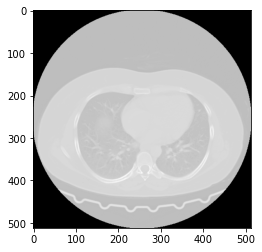

anon_10.dcm
(512, 512)


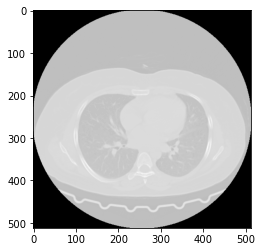

anon_11.dcm
(512, 512)


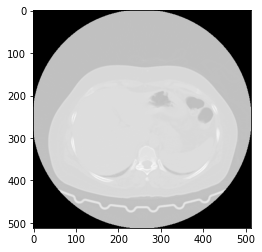

anon_12.dcm
(512, 512)


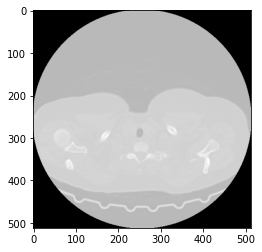

anon_13.dcm
(512, 512)


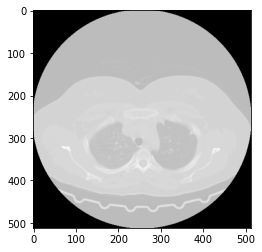

anon_14.dcm
(512, 512)


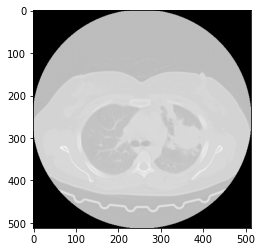

anon_15.dcm
(512, 512)


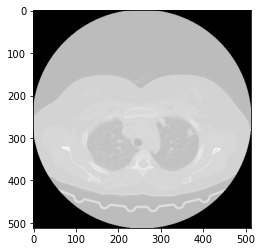

anon_16.dcm
(512, 512)


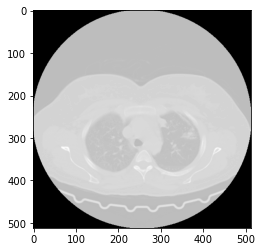

anon_17.dcm
(512, 512)


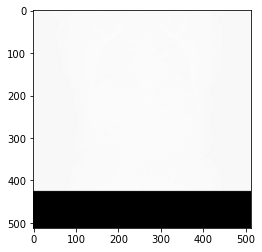

anon_18.dcm
(512, 512)


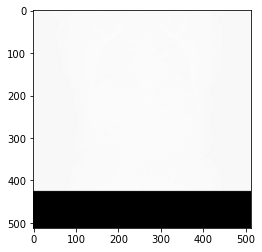

anon_19.dcm
(512, 512)


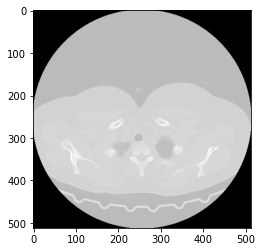

anon_2.dcm
(512, 512)


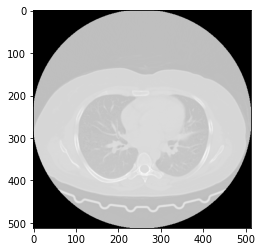

anon_20.dcm
(512, 512)


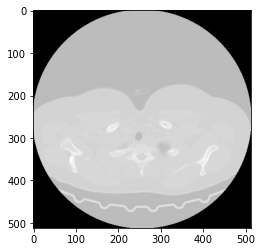

anon_21.dcm
(512, 512)


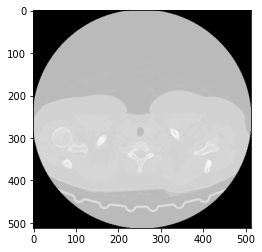

anon_22.dcm
(512, 512)


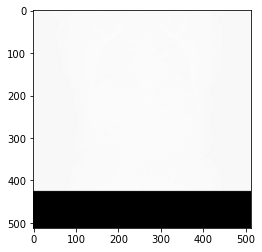

anon_23.dcm
(512, 512)


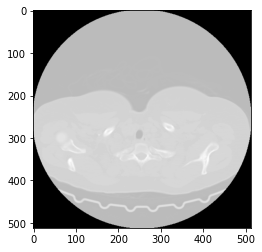

anon_24.dcm
(512, 512)


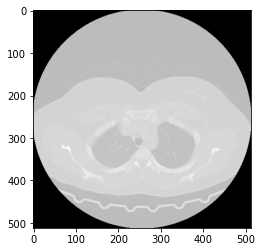

anon_25.dcm
(512, 512)


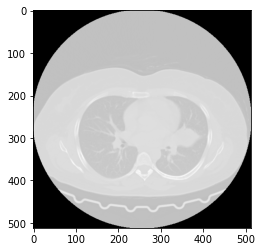

anon_26.dcm
(512, 512)


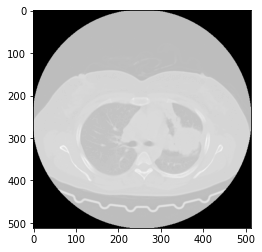

anon_27.dcm
(512, 512)


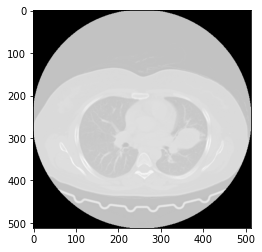

anon_29.dcm
(512, 512)


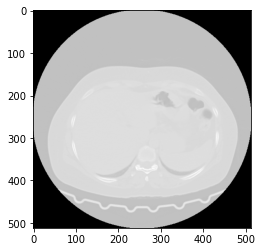

anon_3.dcm
(512, 512)


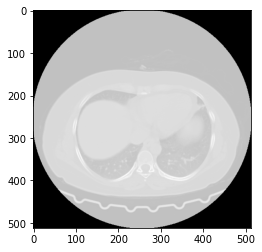

anon_30.dcm
(512, 512)


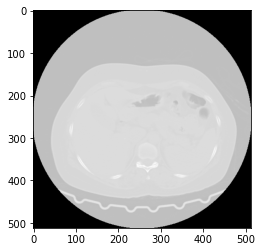

anon_31.dcm
(512, 512)


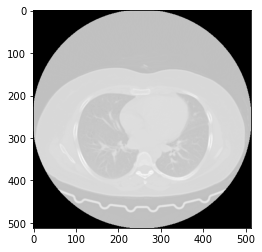

anon_32.dcm
(512, 512)


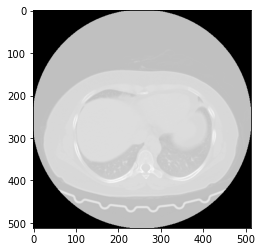

anon_33.dcm
(512, 512)


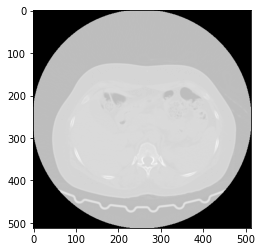

anon_34.dcm
(512, 512)


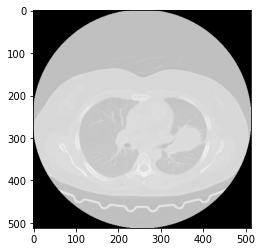

anon_35.dcm
(512, 512)


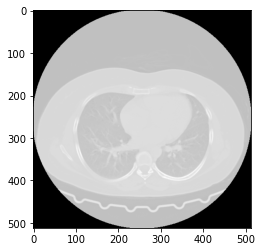

anon_36.dcm
(512, 512)


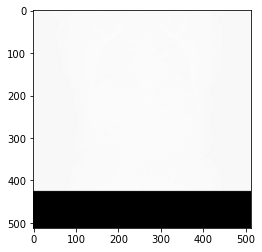

anon_37.dcm
(512, 512)


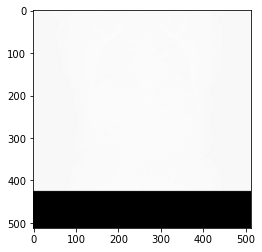

anon_38.dcm
(512, 512)


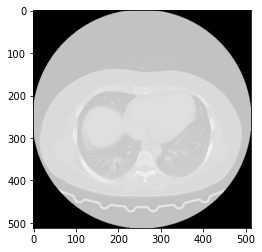

anon_39.dcm
(512, 512)


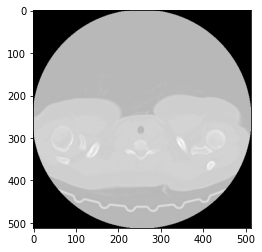

anon_4.dcm
(512, 512)


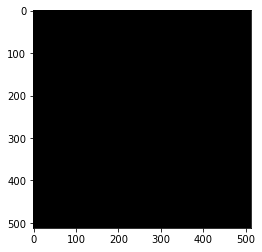

anon_40.dcm
(512, 512)


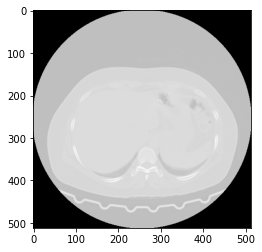

anon_41.dcm
(512, 512)


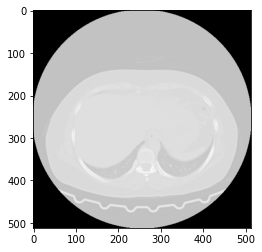

anon_42.dcm
(512, 512)


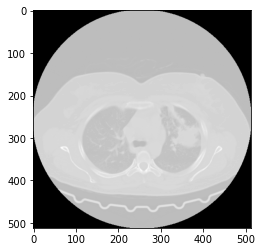

anon_43.dcm
(512, 512)


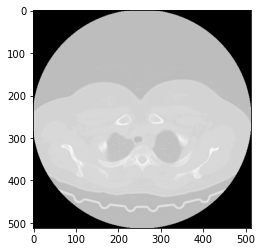

anon_44.dcm
(512, 512)


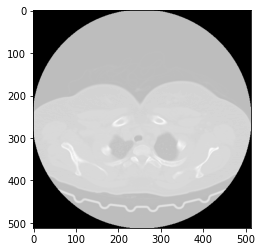

anon_45.dcm
(512, 512)


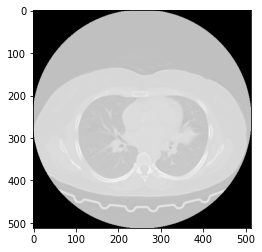

anon_46.dcm
(512, 512)


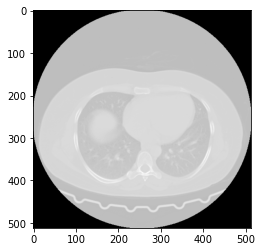

anon_47.dcm
(512, 512)


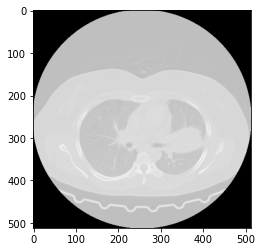

anon_48.dcm
(512, 512)


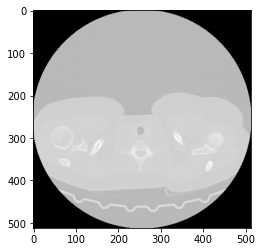

anon_49.dcm
(512, 512)


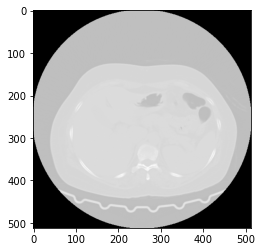

anon_5.dcm
(512, 512)


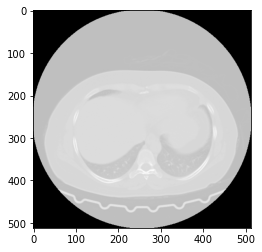

anon_50.dcm
(512, 512)


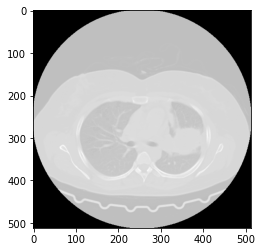

anon_51.dcm
(512, 512)


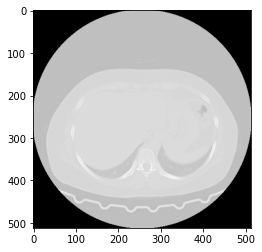

anon_52.dcm
(512, 512)


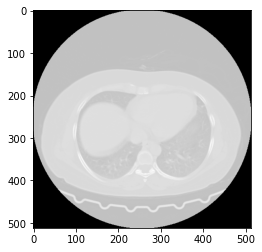

anon_53.dcm
(512, 512)


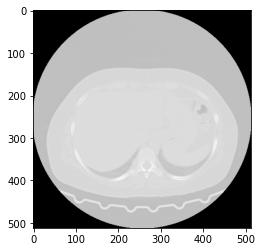

anon_54.dcm
(512, 512)


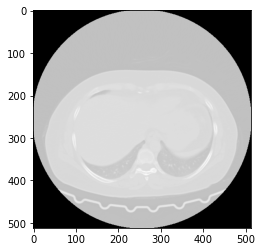

anon_55.dcm
(512, 512)


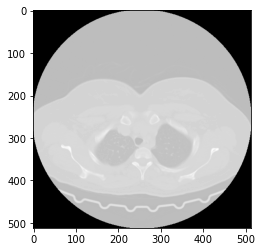

anon_56.dcm
(512, 512)


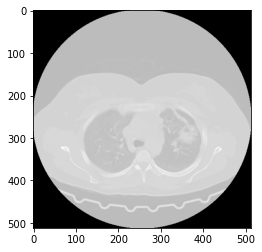

anon_57.dcm
(512, 512)


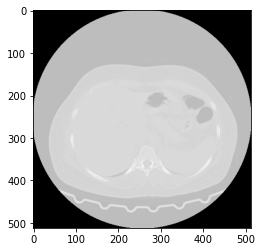

anon_6.dcm
(512, 512)


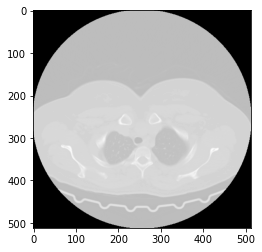

anon_7.dcm
(512, 512)


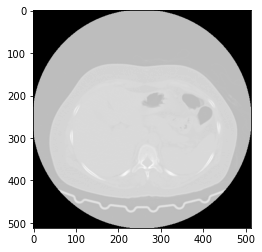

anon_8.dcm
(512, 512)


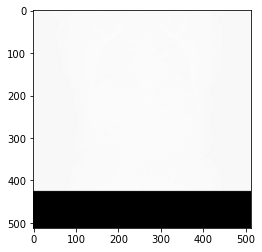

anon_9.dcm
(512, 512)


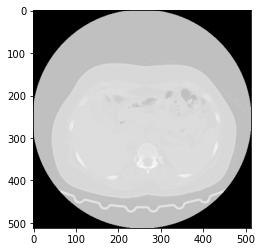

In [2]:
import os

# Define the folder path where the images are stored
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7865\7865'

uids = []
# Loop through all files in the folder
for filename in os.listdir(folder_path):
    
    # Check if the file is an image file (you can add other file types as well)
        
        # Open the image file using Pillow
        #img = Image.open(os.path.join(folder_path, filename))
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))
        try:
            img = sample_image.pixel_array
        except:
            continue
        print(filename)
        print(img.shape)
        # Display the image
        plt.imshow(img,cmap="gray")
        plt.show()
        
        uid = sample_image.SeriesInstanceUID
        uids.append(uid)

In [3]:
from collections import Counter

uid_counts = Counter(uids)

most_common_uid = uid_counts.most_common(1)[0][0]

print(uid_counts)
print("Most common Series Instance UID:", most_common_uid)
print("Number of occurrences:", uid_counts[most_common_uid])

folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7865\7865'
tmp_path    = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\tmp0'

if not os.path.exists(tmp_path):
    os.makedirs(tmp_path)

for filename in os.listdir(folder_path):
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))   
        uid = sample_image.SeriesInstanceUID    
        if uid == most_common_uid:
            shutil.copy(os.path.join(folder_path, filename),tmp_path)
            
path_for_saving_images=r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'
if not os.path.exists(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'):
    os.makedirs(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume')

dicom2nifti.dicom_series_to_nifti(tmp_path, os.path.join(path_for_saving_images, '7865' +'.nii.gz'))


Counter({'1.3.12.2.1107.5.1.7.137375.30000022052414403084000000232': 49, '1.3.12.2.1107.5.1.7.137375.30000022052414403084000000092': 6, '1.3.12.2.1107.5.1.7.137375.30000022052414403084000000219': 1})
Most common Series Instance UID: 1.3.12.2.1107.5.1.7.137375.30000022052414403084000000232
Number of occurrences: 49


{'NII_FILE': 'C:\\Users\\DELL\\Downloads\\Manentia AI\\tmp\\lobe_sample_data\\nifti_saving\\7865.nii.gz',
 'NII': <nibabel.nifti1.Nifti1Image at 0x199cb9c5b50>,
 'MAX_SLICE_INCREMENT': 5.000000000000003}

anon_1.dcm
(512, 512)


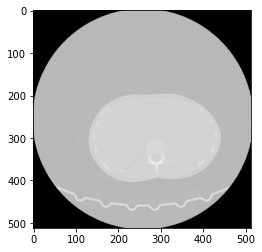

anon_10.dcm
(512, 512)


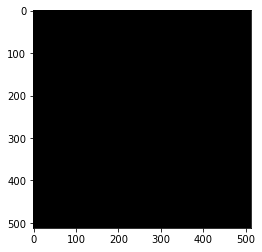

anon_11.dcm
(512, 512)


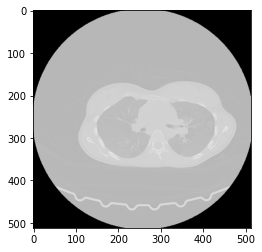

anon_12.dcm
(512, 512)


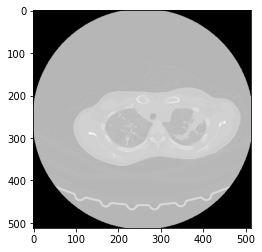

anon_13.dcm
(512, 512)


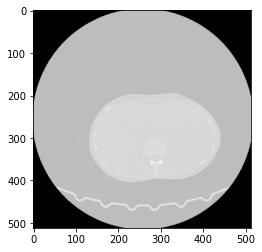

anon_15.dcm
(512, 512)


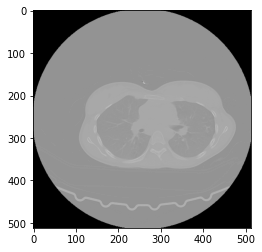

anon_16.dcm
(512, 512)


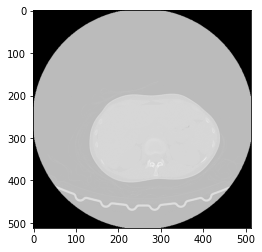

anon_17.dcm
(512, 512)


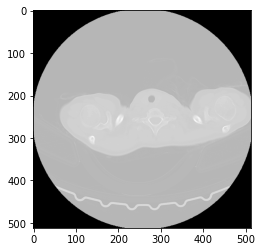

anon_18.dcm
(512, 512)


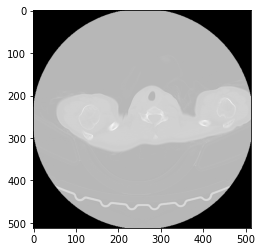

anon_19.dcm
(512, 512)


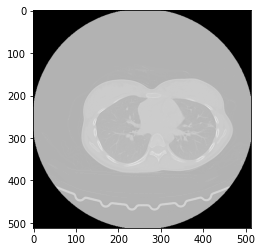

anon_2.dcm
(512, 512)


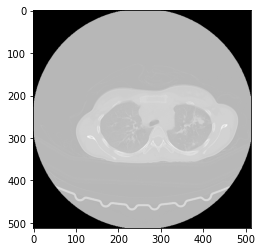

anon_20.dcm
(512, 512)


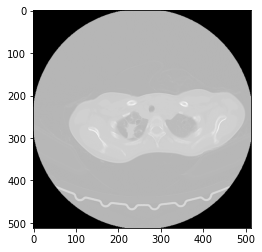

anon_21.dcm
(512, 512)


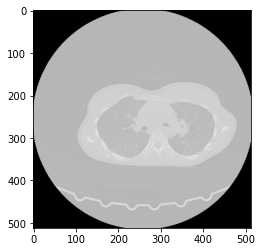

anon_22.dcm
(512, 512)


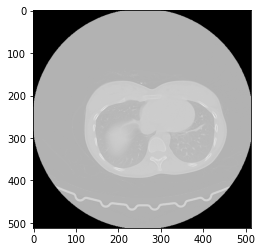

anon_23.dcm
(512, 512)


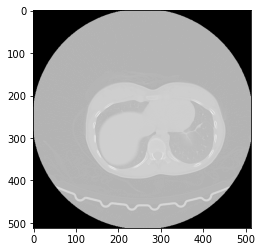

anon_24.dcm
(512, 512)


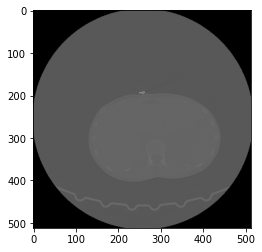

anon_25.dcm
(512, 512)


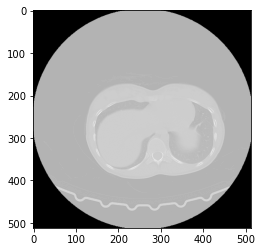

anon_26.dcm
(512, 512)


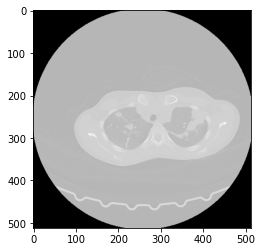

anon_27.dcm
(512, 512)


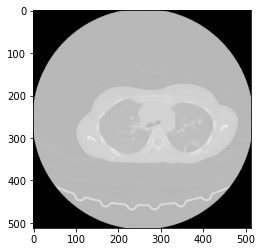

anon_28.dcm
(512, 512)


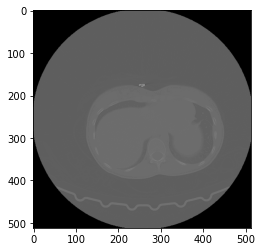

anon_29.dcm
(512, 512)


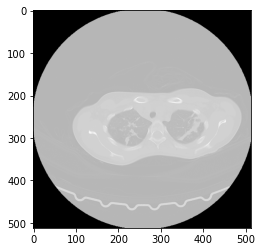

anon_3.dcm
(512, 512)


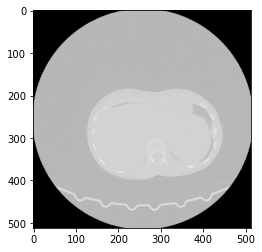

anon_30.dcm
(512, 512)


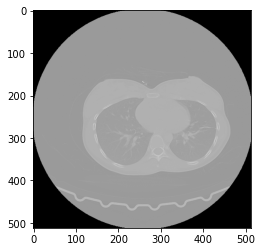

anon_31.dcm
(512, 512)


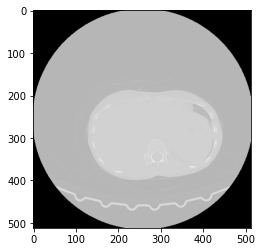

anon_32.dcm
(512, 512)


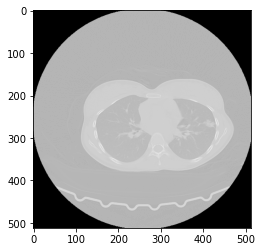

anon_33.dcm
(512, 512)


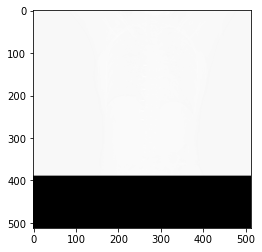

anon_34.dcm
(512, 512)


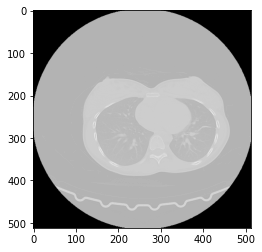

anon_35.dcm
(512, 512)


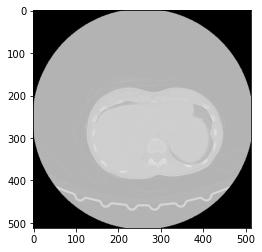

anon_36.dcm
(512, 512)


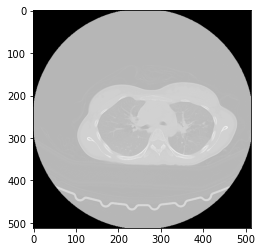

anon_37.dcm
(512, 512)


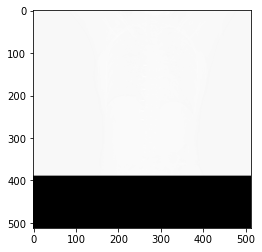

anon_38.dcm
(512, 512)


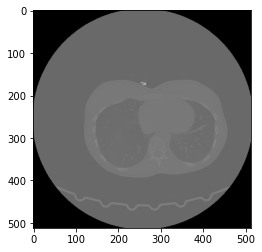

anon_39.dcm
(512, 512)


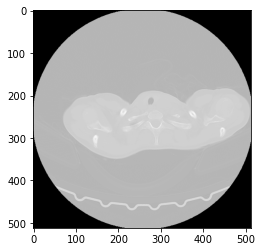

anon_4.dcm
(512, 512)


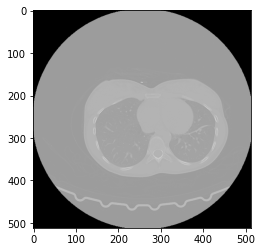

anon_40.dcm
(512, 512)


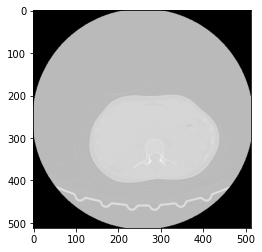

anon_41.dcm
(512, 512)


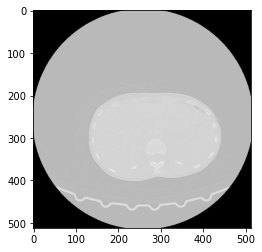

anon_42.dcm
(512, 512)


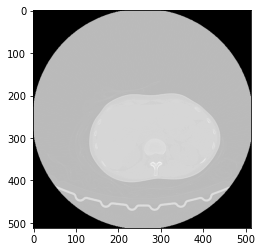

anon_43.dcm
(512, 512)


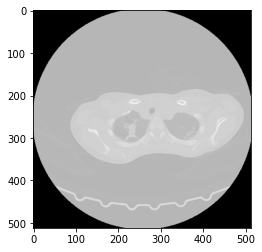

anon_44.dcm
(512, 512)


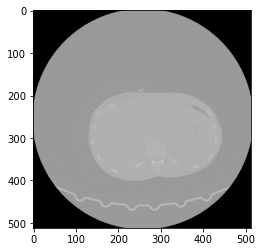

anon_45.dcm
(512, 512)


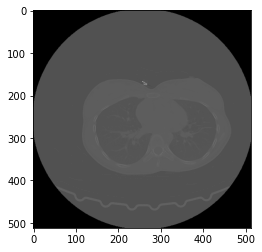

anon_46.dcm
(512, 512)


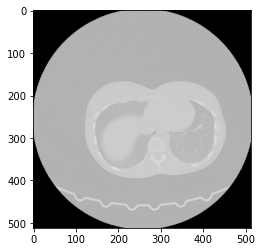

anon_47.dcm
(512, 512)


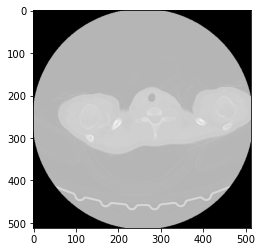

anon_48.dcm
(512, 512)


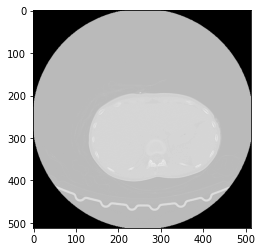

anon_49.dcm
(512, 512)


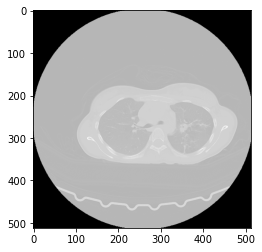

anon_5.dcm
(512, 512)


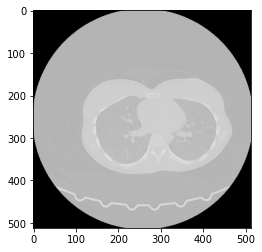

anon_50.dcm
(512, 512)


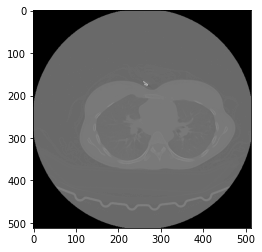

anon_51.dcm
(512, 512)


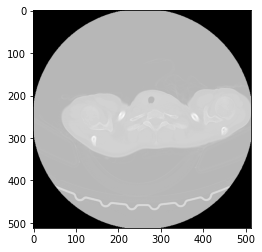

anon_52.dcm
(512, 512)


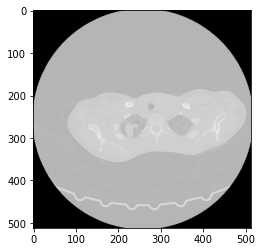

anon_53.dcm
(512, 512)


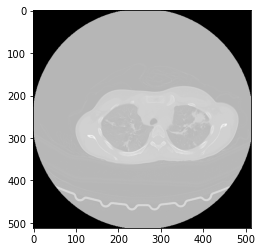

anon_54.dcm
(512, 512)


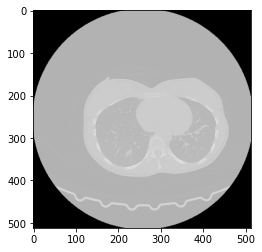

anon_55.dcm
(512, 512)


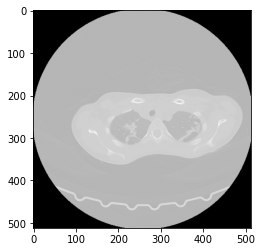

anon_56.dcm
(512, 512)


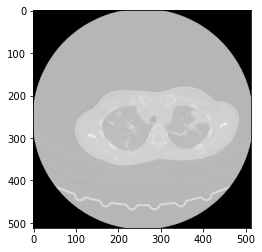

anon_57.dcm
(512, 512)


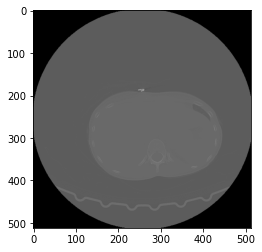

anon_58.dcm
(512, 512)


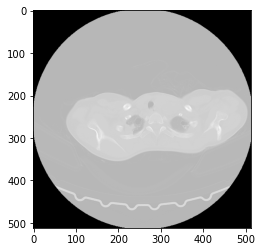

anon_59.dcm
(512, 512)


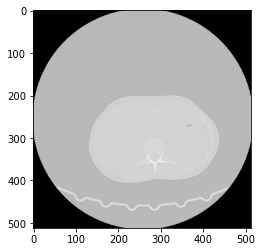

anon_6.dcm
(512, 512)


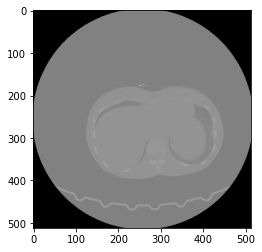

anon_60.dcm
(512, 512)


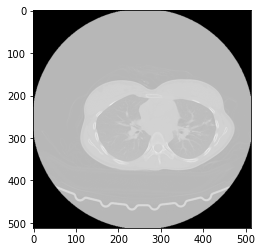

anon_61.dcm
(512, 512)


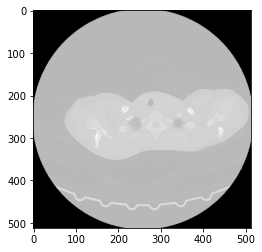

anon_62.dcm
(512, 512)


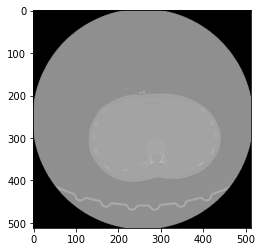

anon_7.dcm
(512, 512)


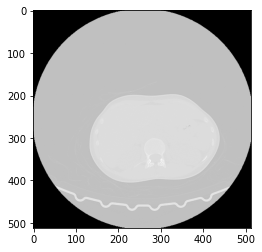

anon_8.dcm
(512, 512)


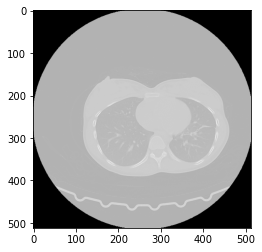

anon_9.dcm
(512, 512)


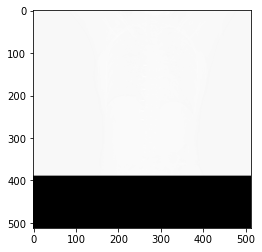

In [4]:
# Define the folder path where the images are stored
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7897\7897'

uids = []
# Loop through all files in the folder
for filename in os.listdir(folder_path):
    
    # Check if the file is an image file (you can add other file types as well)
        
        # Open the image file using Pillow
        #img = Image.open(os.path.join(folder_path, filename))
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))
        try:
            img = sample_image.pixel_array
        except:
            continue
        print(filename)
        print(img.shape)
        # Display the image
        plt.imshow(img,cmap="gray")
        plt.show()
        
        uid = sample_image.SeriesInstanceUID
        uids.append(uid)

In [5]:
from collections import Counter

uid_counts = Counter(uids)

most_common_uid = uid_counts.most_common(1)[0][0]

print(uid_counts)
print("Most common Series Instance UID:", most_common_uid)
print("Number of occurrences:", uid_counts[most_common_uid])
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7897\7897'
tmp_path    = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\tmp1'

if not os.path.exists(tmp_path):
    os.makedirs(tmp_path)

for filename in os.listdir(folder_path):
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))   
        uid = sample_image.SeriesInstanceUID    
        if uid == most_common_uid:
            shutil.copy(os.path.join(folder_path, filename),tmp_path)
            
path_for_saving_images=r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'
if not os.path.exists(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'):
    os.makedirs(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume')

dicom2nifti.dicom_series_to_nifti(tmp_path, os.path.join(path_for_saving_images, '7897' +'.nii.gz'))

Counter({'1.3.12.2.1107.5.1.7.137606.30000022052410364590100000198': 57, '1.3.12.2.1107.5.1.7.137606.30000022052410364590100000092': 3, '1.3.12.2.1107.5.1.7.137606.30000022052410364590100000207': 1})
Most common Series Instance UID: 1.3.12.2.1107.5.1.7.137606.30000022052410364590100000198
Number of occurrences: 57


{'NII_FILE': 'C:\\Users\\DELL\\Downloads\\Manentia AI\\tmp\\lobe_sample_data\\nifti_saving\\7897.nii.gz',
 'NII': <nibabel.nifti1.Nifti1Image at 0x199cbae28b0>,
 'MAX_SLICE_INCREMENT': 5.0}

anon_1.dcm
(512, 512)


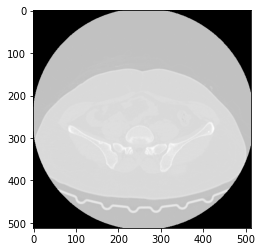

anon_10.dcm
(512, 512)


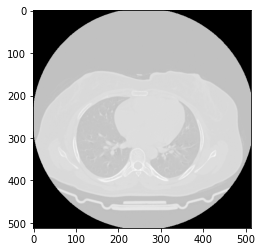

anon_11.dcm
(512, 512)


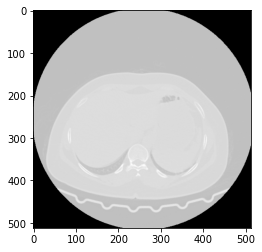

anon_12.dcm
(512, 512)


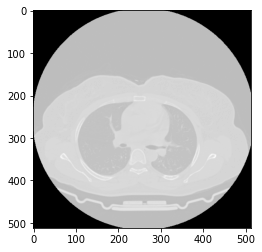

anon_13.dcm
(512, 512)


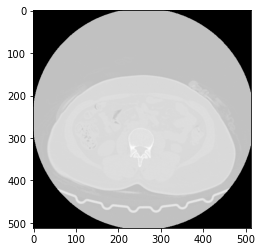

anon_14.dcm
(512, 512)


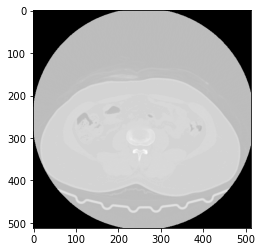

anon_15.dcm
(512, 512)


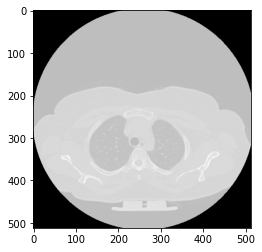

anon_16.dcm
(512, 512)


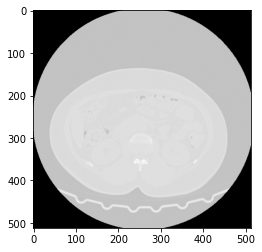

anon_17.dcm
(512, 512)


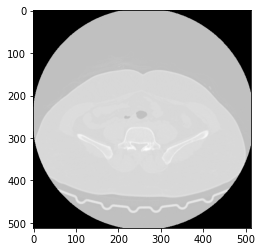

anon_18.dcm
(512, 512)


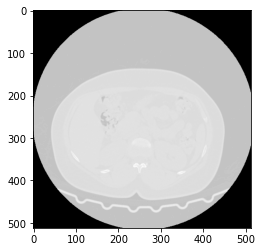

anon_19.dcm
(512, 512)


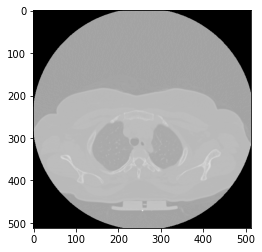

anon_2.dcm
(512, 512)


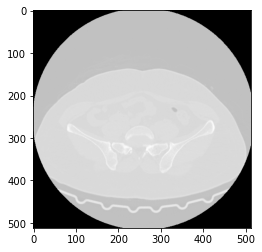

anon_20.dcm
(512, 512)


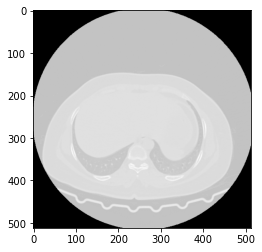

anon_21.dcm
(512, 512)


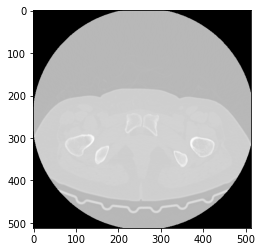

anon_22.dcm
(512, 512)


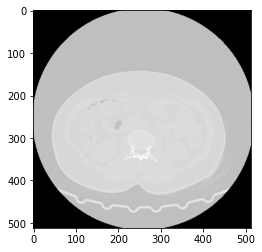

anon_23.dcm
(512, 512)


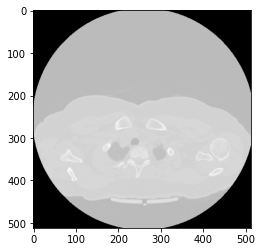

anon_24.dcm
(512, 512)


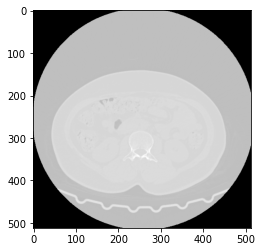

anon_25.dcm
(512, 512)


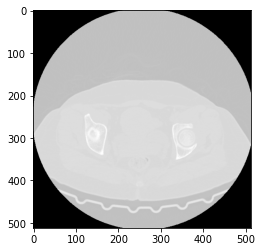

anon_26.dcm
(512, 512)


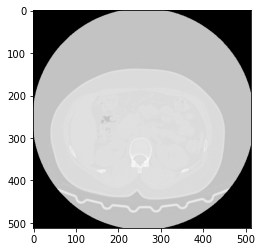

anon_27.dcm
(512, 512)


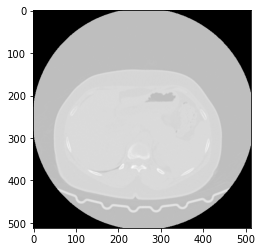

anon_28.dcm
(512, 512)


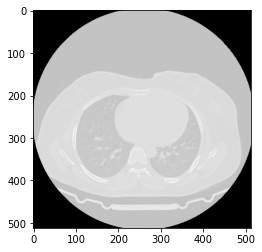

anon_29.dcm
(512, 512)


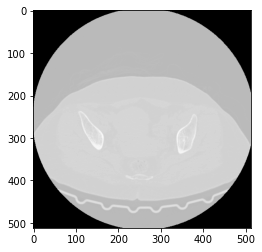

anon_3.dcm
(512, 512)


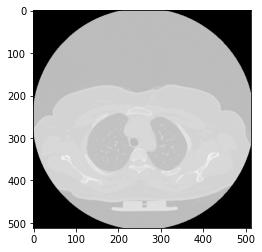

anon_30.dcm
(512, 512)


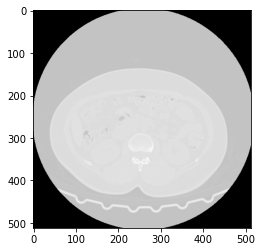

anon_31.dcm
(512, 512)


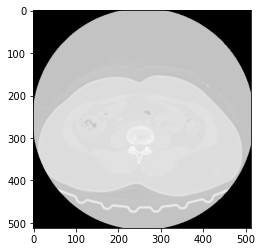

anon_32.dcm
(512, 512)


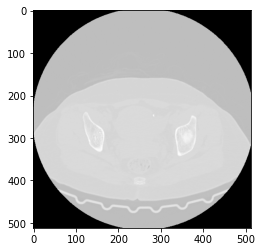

anon_33.dcm
(512, 512)


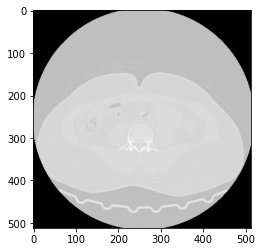

anon_34.dcm
(512, 512)


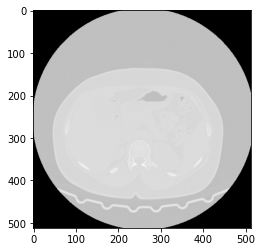

anon_35.dcm
(512, 512)


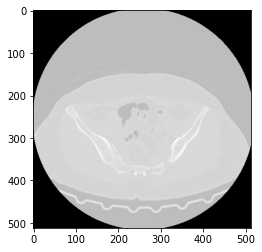

anon_36.dcm
(512, 512)


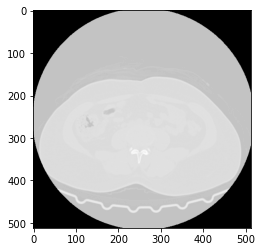

anon_37.dcm
(512, 512)


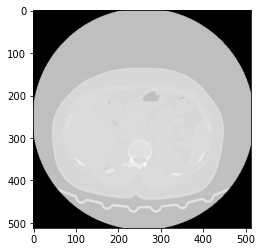

anon_38.dcm
(512, 512)


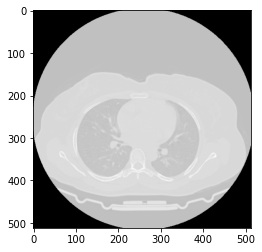

anon_39.dcm
(512, 512)


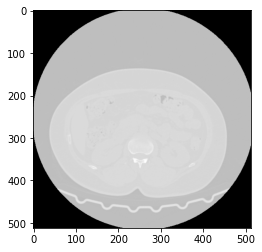

anon_4.dcm
(512, 512)


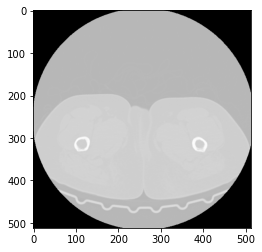

anon_40.dcm
(512, 512)


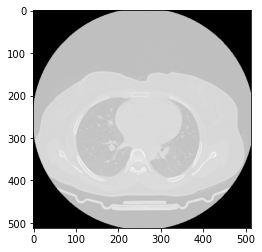

anon_41.dcm
(512, 512)


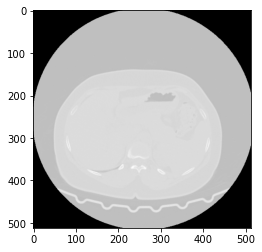

anon_42.dcm
(512, 512)


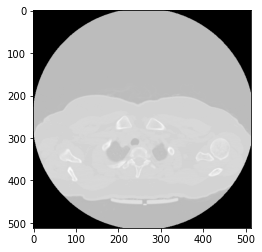

anon_43.dcm
(512, 512)


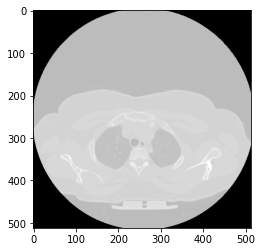

anon_44.dcm
(512, 512)


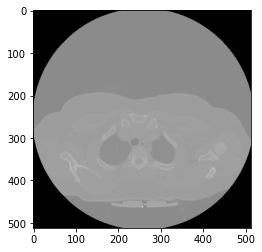

anon_45.dcm
(512, 512)


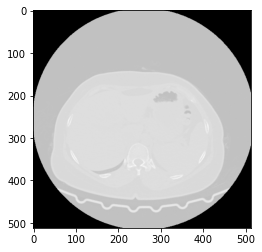

anon_46.dcm
(512, 512)


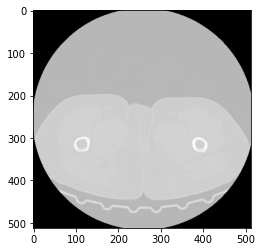

anon_47.dcm
(512, 512)


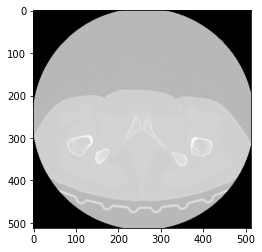

anon_5.dcm
(512, 512)


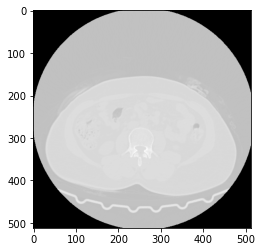

anon_6.dcm
(512, 512)


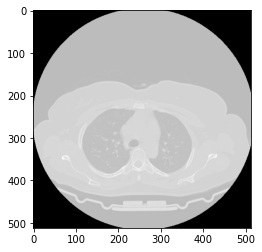

anon_7.dcm
(512, 512)


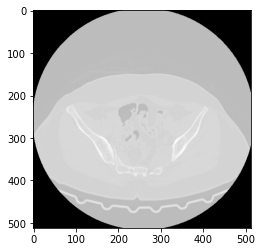

anon_8.dcm
(512, 512)


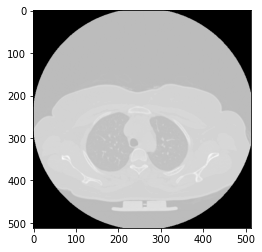

anon_9.dcm
(512, 512)


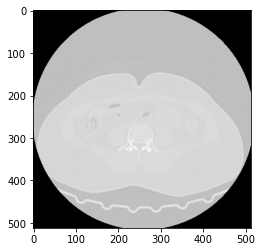

In [6]:
# Define the folder path where the images are stored
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7898\7898'

uids = []
# Loop through all files in the folder
for filename in os.listdir(folder_path):
    
    # Check if the file is an image file (you can add other file types as well)
        
        # Open the image file using Pillow
        #img = Image.open(os.path.join(folder_path, filename))
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))
        try:
            img = sample_image.pixel_array
        except:
            continue
        print(filename)
        print(img.shape)
        # Display the image
        plt.imshow(img,cmap="gray")
        plt.show()
        
        uid = sample_image.SeriesInstanceUID
        uids.append(uid)

In [7]:
from collections import Counter

uid_counts = Counter(uids)

most_common_uid = uid_counts.most_common(1)[0][0]

print(uid_counts)
print("Most common Series Instance UID:", most_common_uid)
print("Number of occurrences:", uid_counts[most_common_uid])
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7898\7898'
tmp_path    = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\tmp2'

if not os.path.exists(tmp_path):
    os.makedirs(tmp_path)

for filename in os.listdir(folder_path):
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))   
        uid = sample_image.SeriesInstanceUID    
        if uid == most_common_uid:
            shutil.copy(os.path.join(folder_path, filename),tmp_path)
            
path_for_saving_images=r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'
if not os.path.exists(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'):
    os.makedirs(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume')
    
dicom2nifti.settings.disable_validate_slice_increment()
dicom2nifti.dicom_series_to_nifti(tmp_path, os.path.join(path_for_saving_images, '7898' +'.nii.gz'))

Counter({'1.3.12.2.1107.5.1.7.140391.30000022052711572378000001563': 47})
Most common Series Instance UID: 1.3.12.2.1107.5.1.7.140391.30000022052711572378000001563
Number of occurrences: 47


{'NII_FILE': 'C:\\Users\\DELL\\Downloads\\Manentia AI\\tmp\\lobe_sample_data\\nifti_saving\\7898.nii.gz',
 'NII': <nibabel.nifti1.Nifti1Image at 0x199cba769d0>,
 'MAX_SLICE_INCREMENT': 12.23913043478261}

anon_1.dcm
(512, 512)


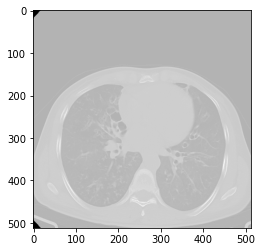

anon_10.dcm
(512, 512)


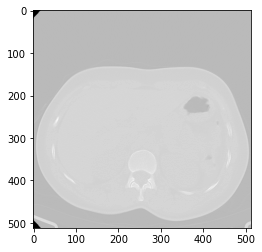

anon_11.dcm
(512, 512)


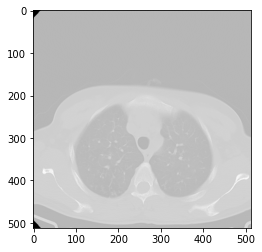

anon_12.dcm
(512, 512)


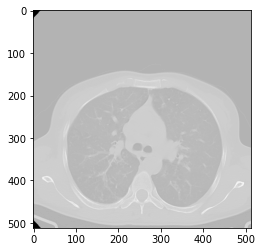

anon_13.dcm
(512, 512)


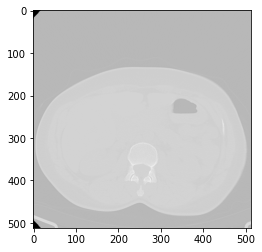

anon_14.dcm
(512, 512)


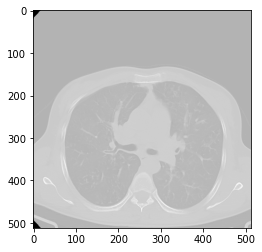

anon_15.dcm
(512, 512)


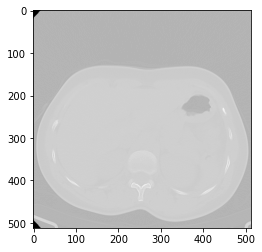

anon_16.dcm
(512, 512)


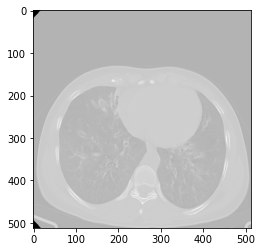

anon_17.dcm
(512, 512)


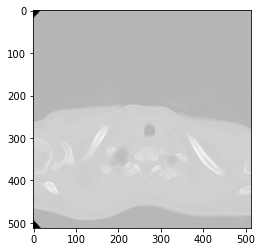

anon_18.dcm
(512, 512)


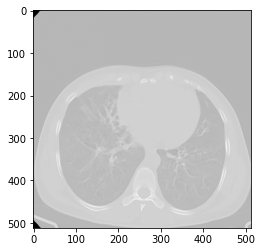

anon_19.dcm
(512, 512)


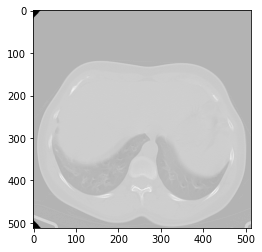

anon_2.dcm
(512, 512)


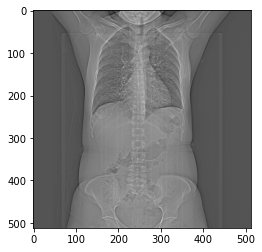

anon_20.dcm
(512, 512)


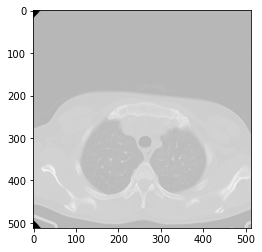

anon_21.dcm
(512, 512)


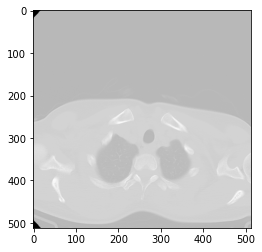

anon_22.dcm
(512, 512)


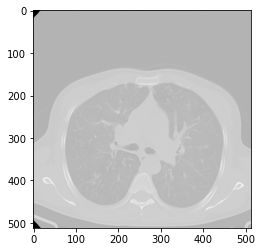

anon_23.dcm
(512, 512)


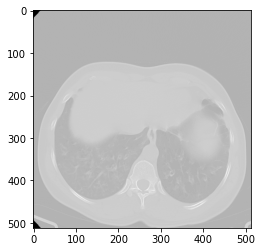

anon_24.dcm
(512, 512)


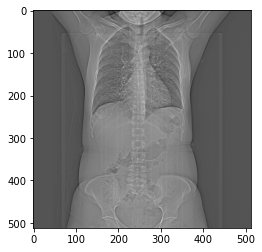

anon_25.dcm
(512, 512)


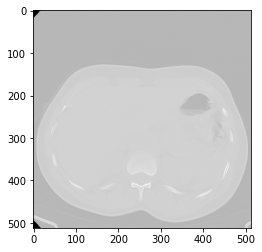

anon_26.dcm
(512, 512)


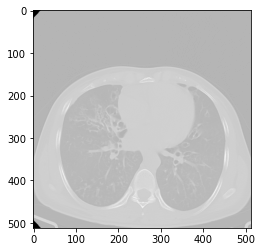

anon_27.dcm
(512, 512)


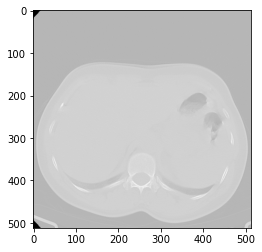

anon_28.dcm
(512, 512)


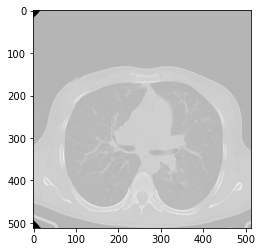

anon_29.dcm
(512, 512)


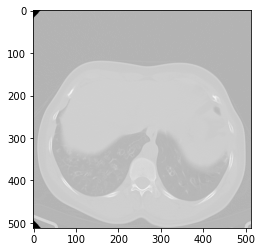

anon_3.dcm
(512, 512)


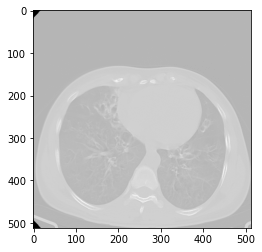

anon_30.dcm
(512, 512)


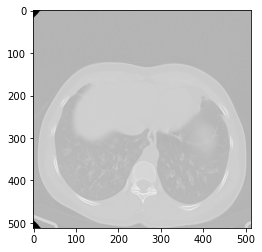

anon_31.dcm
(512, 512)


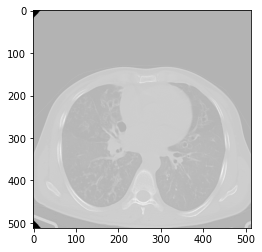

anon_32.dcm
(512, 512)


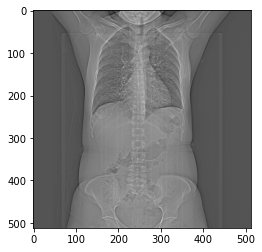

anon_33.dcm
(512, 512)


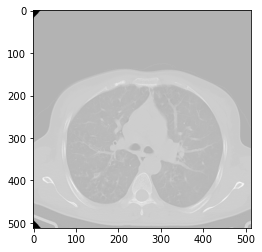

anon_34.dcm
(512, 512)


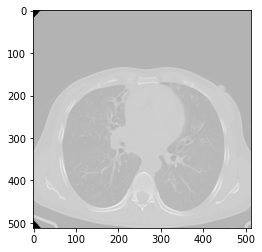

anon_35.dcm
(512, 512)


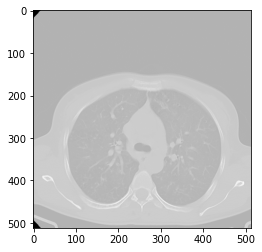

anon_36.dcm
(512, 512)


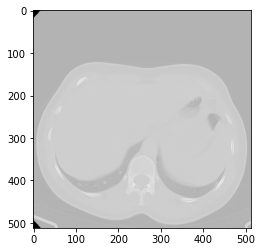

anon_37.dcm
(512, 512)


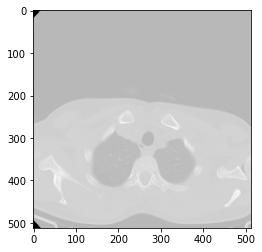

anon_38.dcm
(512, 512)


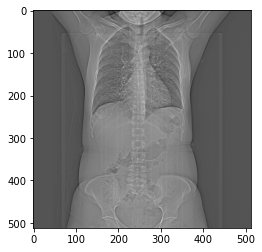

anon_39.dcm
(512, 512)


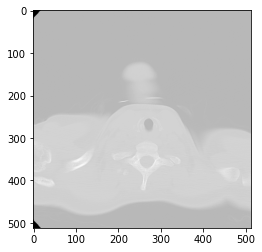

anon_4.dcm
(512, 512)


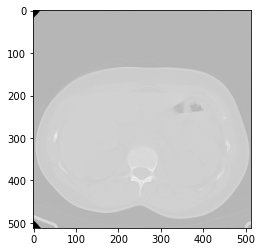

anon_40.dcm
(512, 512)


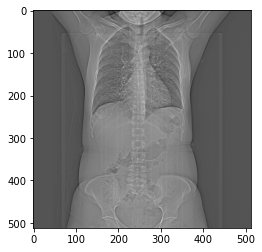

anon_41.dcm
(512, 512)


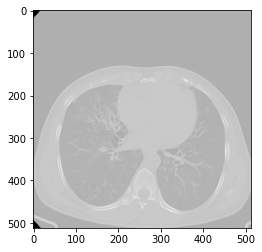

anon_42.dcm
(512, 512)


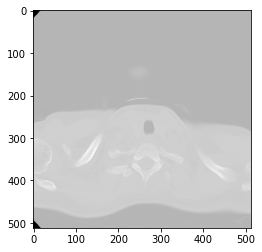

anon_43.dcm
(512, 512)


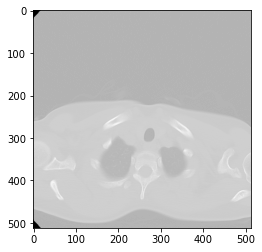

anon_44.dcm
(512, 512)


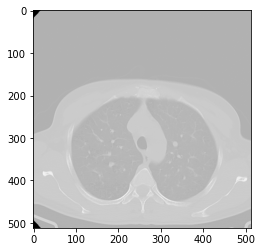

anon_45.dcm
(512, 512)


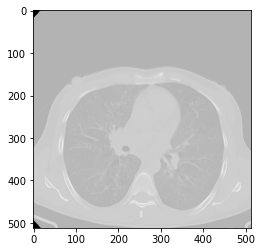

anon_46.dcm
(512, 512)


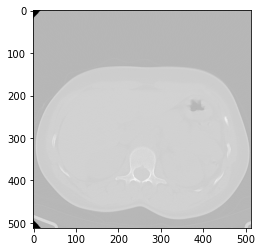

anon_47.dcm
(512, 512)


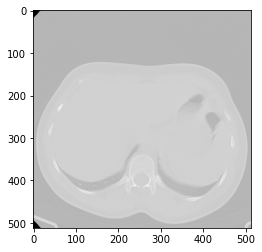

anon_48.dcm
(512, 512)


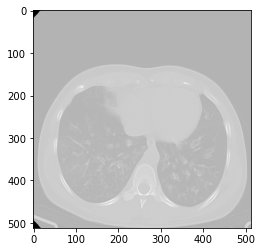

anon_49.dcm
(512, 512)


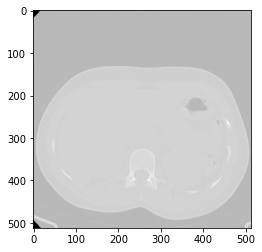

anon_5.dcm
(512, 512)


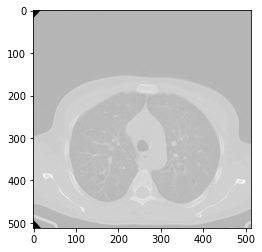

anon_50.dcm
(512, 512)


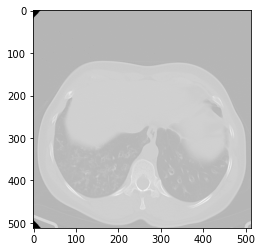

anon_51.dcm
(512, 512)


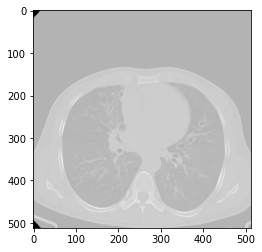

anon_52.dcm
(512, 512)


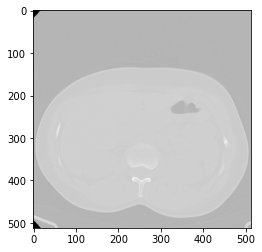

anon_53.dcm
(512, 512)


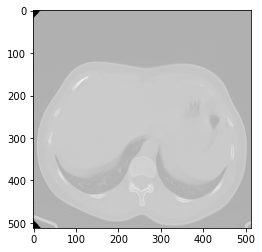

anon_54.dcm
(512, 512)


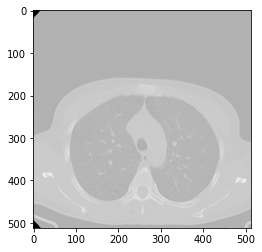

anon_55.dcm
(512, 512)


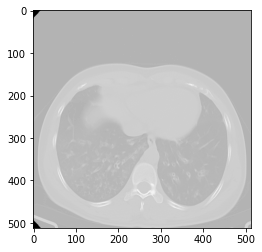

anon_56.dcm
(512, 512)


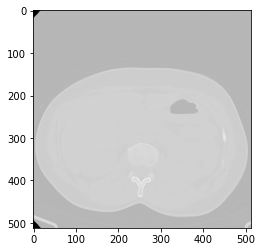

anon_57.dcm
(512, 512)


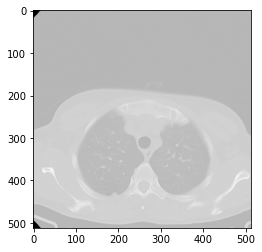

anon_58.dcm
(512, 512)


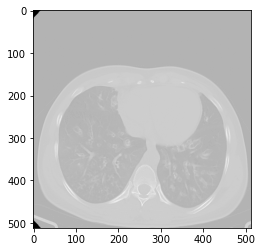

anon_59.dcm
(512, 512)


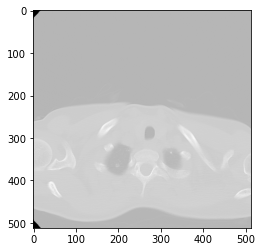

anon_6.dcm
(512, 512)


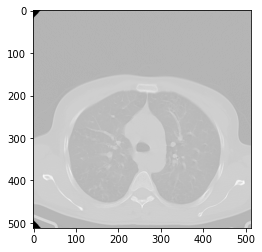

anon_60.dcm
(512, 512)


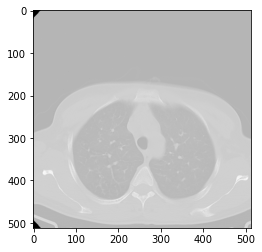

anon_61.dcm
(512, 512)


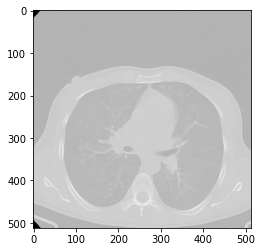

anon_62.dcm
(512, 512)


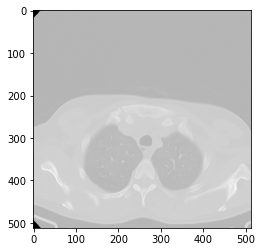

anon_63.dcm
(512, 512)


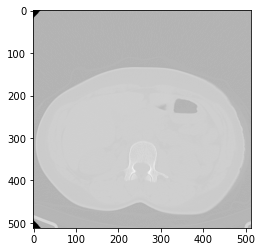

anon_7.dcm
(512, 512)


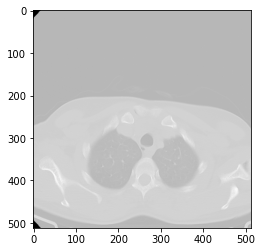

anon_8.dcm
(512, 512)


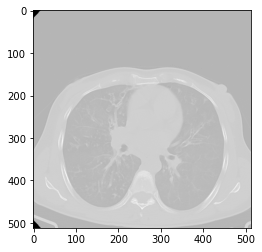

anon_9.dcm
(512, 512)


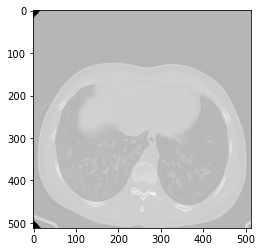

In [8]:
# Define the folder path where the images are stored
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7899\7899'

uids = []
# Loop through all files in the folder
for filename in os.listdir(folder_path):
    
    # Check if the file is an image file (you can add other file types as well)
        
        # Open the image file using Pillow
        #img = Image.open(os.path.join(folder_path, filename))
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))
        try:
            img = sample_image.pixel_array
        except:
            continue
        print(filename)
        print(img.shape)
        # Display the image
        plt.imshow(img,cmap="gray")
        plt.show()
        
        uid = sample_image.SeriesInstanceUID
        uids.append(uid)

In [9]:
from collections import Counter

uid_counts = Counter(uids)

most_common_uid = uid_counts.most_common(1)[0][0]

print(uid_counts)
print("Most common Series Instance UID:", most_common_uid)
print("Number of occurrences:", uid_counts[most_common_uid])
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7899\7899'
tmp_path    = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\tmp3'

if not os.path.exists(tmp_path):
    os.makedirs(tmp_path)

for filename in os.listdir(folder_path):
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))   
        uid = sample_image.SeriesInstanceUID    
        if uid == most_common_uid:
            shutil.copy(os.path.join(folder_path, filename),tmp_path)
            
path_for_saving_images=r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'
if not os.path.exists(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'):
    os.makedirs(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume')

dicom2nifti.dicom_series_to_nifti(tmp_path, os.path.join(path_for_saving_images, '7899' +'.nii.gz'))

Counter({'1.3.12.2.1107.5.1.7.137639.30000022052811525649100000208': 58, '1.3.12.2.1107.5.1.7.137639.30000022052811525649100000092': 5})
Most common Series Instance UID: 1.3.12.2.1107.5.1.7.137639.30000022052811525649100000208
Number of occurrences: 58


{'NII_FILE': 'C:\\Users\\DELL\\Downloads\\Manentia AI\\tmp\\lobe_sample_data\\nifti_saving\\7899.nii.gz',
 'NII': <nibabel.nifti1.Nifti1Image at 0x199cfcac9a0>,
 'MAX_SLICE_INCREMENT': 5.000000000000001}

anon_1.dcm
(512, 512)


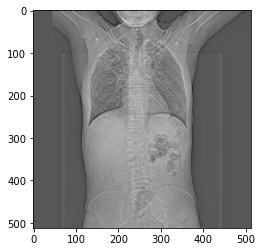

anon_10.dcm
(512, 512)


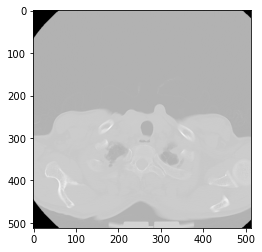

anon_11.dcm
(512, 512)


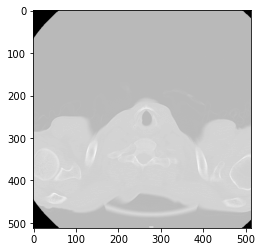

anon_12.dcm
(512, 512)


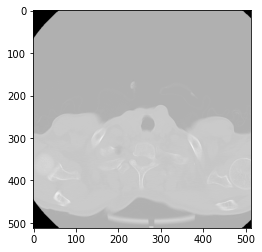

anon_13.dcm
(512, 512)


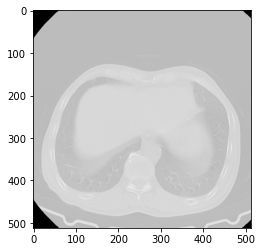

anon_14.dcm
(512, 512)


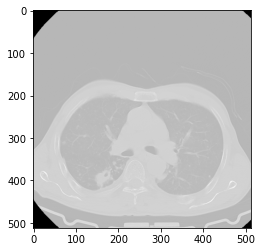

anon_15.dcm
(512, 512)


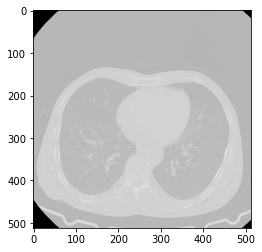

anon_16.dcm
(512, 512)


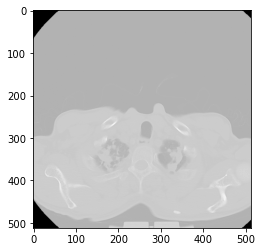

anon_17.dcm
(512, 512)


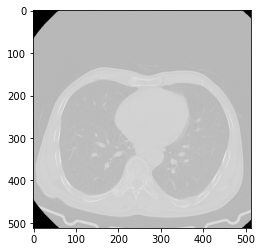

anon_18.dcm
(512, 512)


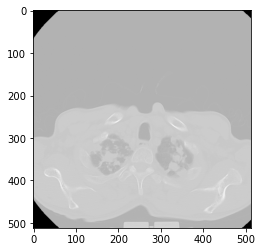

anon_19.dcm
(512, 512)


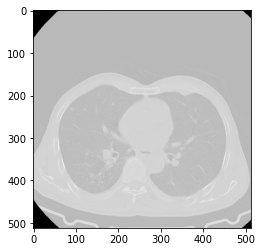

anon_2.dcm
(512, 512)


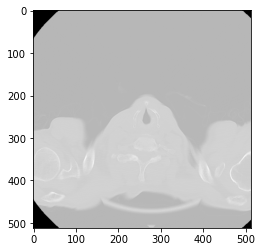

anon_20.dcm
(512, 512)


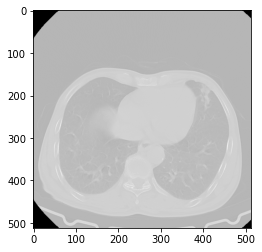

anon_21.dcm
(512, 512)


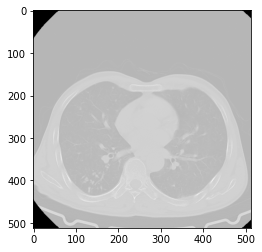

anon_22.dcm
(512, 512)


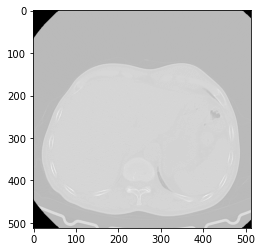

anon_23.dcm
(512, 512)


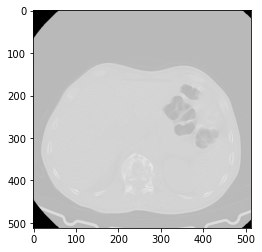

anon_24.dcm
(512, 512)


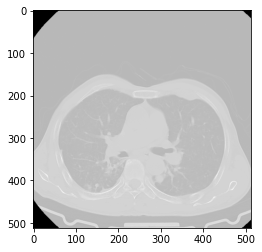

anon_25.dcm
(512, 512)


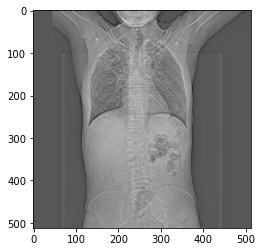

anon_26.dcm
(512, 512)


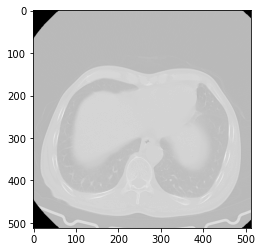

anon_27.dcm
(512, 512)


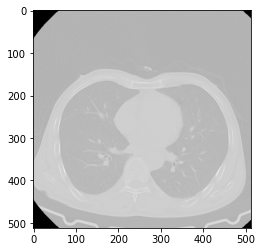

anon_28.dcm
(512, 512)


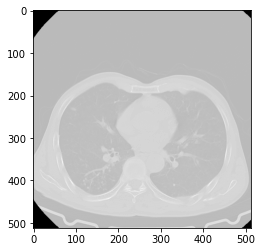

anon_29.dcm
(512, 512)


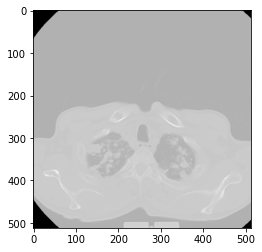

anon_3.dcm
(512, 512)


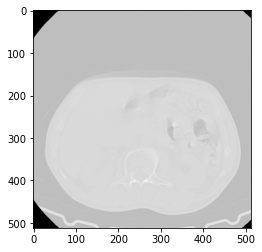

anon_30.dcm
(512, 512)


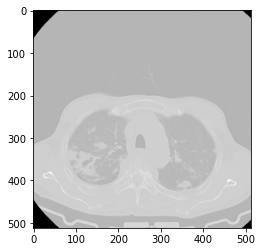

anon_31.dcm
(512, 512)


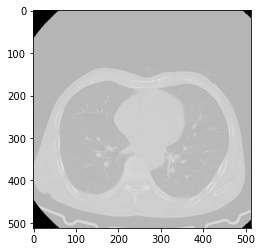

anon_32.dcm
(512, 512)


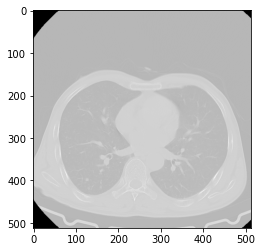

anon_33.dcm
(512, 512)


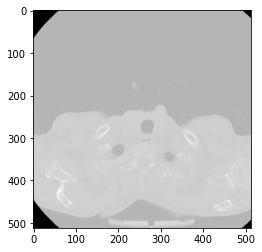

anon_34.dcm
(512, 512)


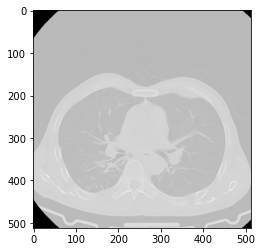

anon_35.dcm
(512, 512)


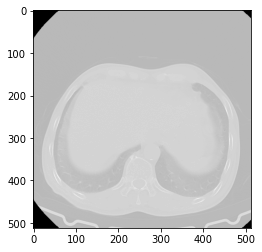

anon_36.dcm
(512, 512)


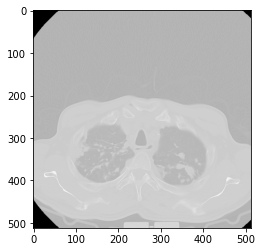

anon_37.dcm
(512, 512)


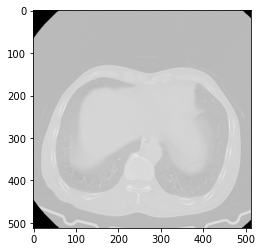

anon_38.dcm
(512, 512)


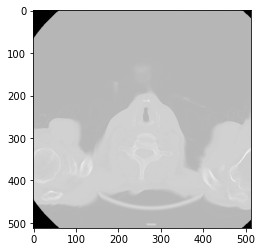

anon_39.dcm
(512, 512)


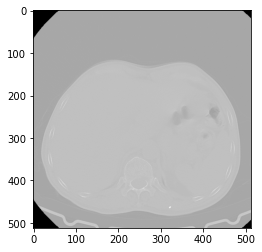

anon_4.dcm
(512, 512)


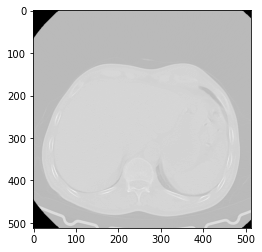

anon_40.dcm
(512, 512)


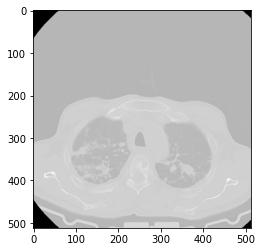

anon_41.dcm
(512, 512)


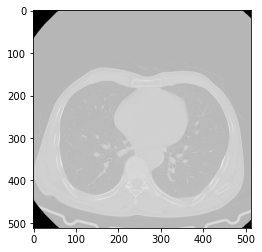

anon_42.dcm
(512, 512)


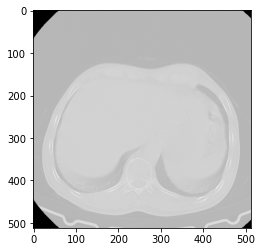

anon_43.dcm
(512, 512)


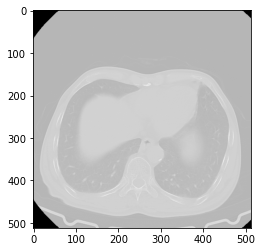

anon_44.dcm
(512, 512)


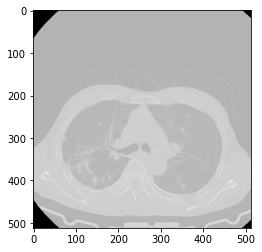

anon_45.dcm
(512, 512)


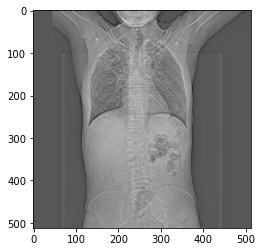

anon_46.dcm
(512, 512)


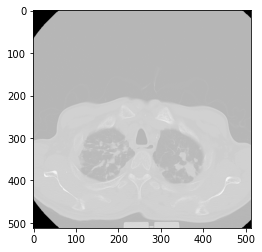

anon_47.dcm
(512, 512)


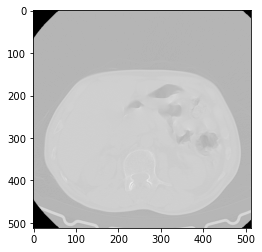

anon_48.dcm
(512, 512)


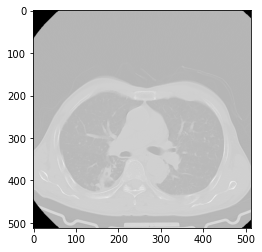

anon_49.dcm
(512, 512)


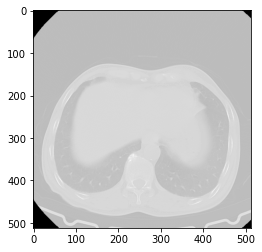

anon_5.dcm
(512, 512)


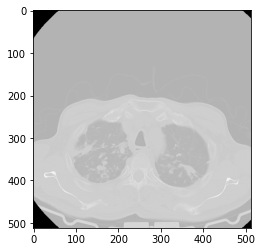

anon_50.dcm
(512, 512)


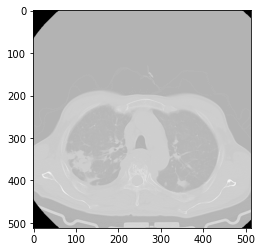

anon_51.dcm
(512, 512)


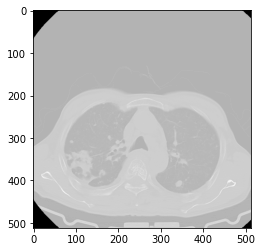

anon_52.dcm
(512, 512)


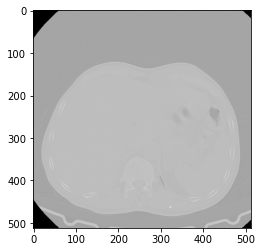

anon_53.dcm
(512, 512)


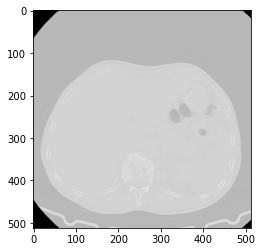

anon_54.dcm
(512, 512)


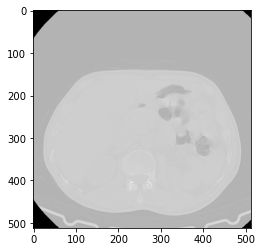

anon_55.dcm
(512, 512)


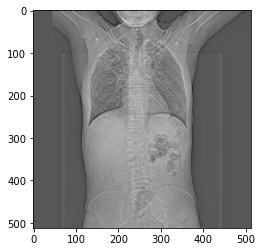

anon_56.dcm
(512, 512)


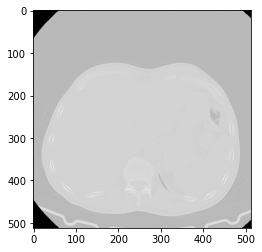

anon_57.dcm
(512, 512)


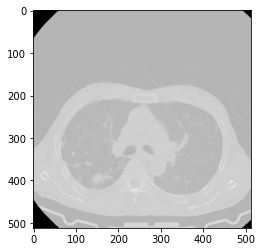

anon_58.dcm
(512, 512)


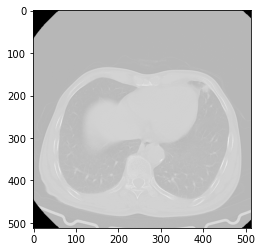

anon_59.dcm
(512, 512)


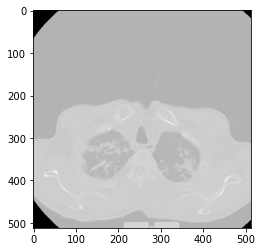

anon_6.dcm
(512, 512)


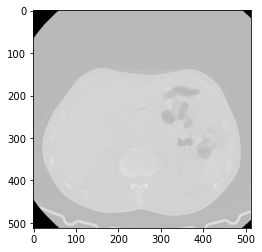

anon_60.dcm
(512, 512)


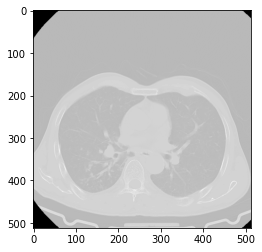

anon_61.dcm
(512, 512)


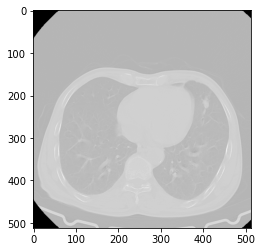

anon_62.dcm
(512, 512)


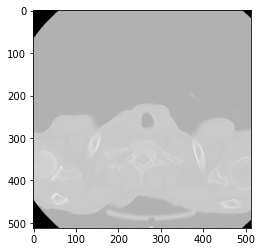

anon_63.dcm
(512, 512)


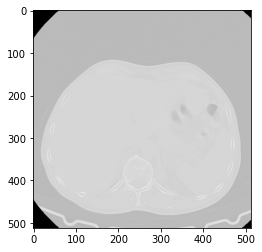

anon_64.dcm
(512, 512)


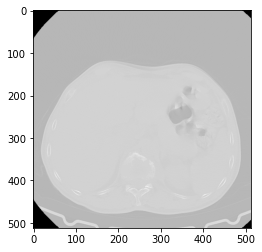

anon_65.dcm
(512, 512)


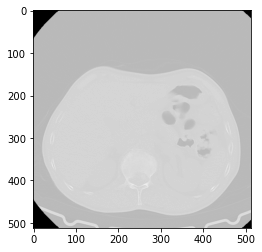

anon_66.dcm
(512, 512)


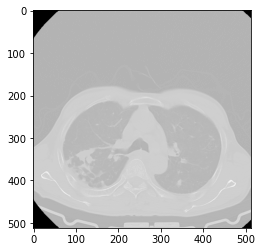

anon_67.dcm
(512, 512)


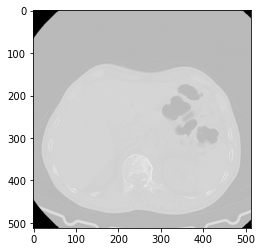

anon_68.dcm
(512, 512)


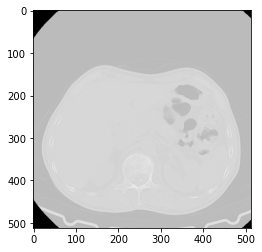

anon_7.dcm
(512, 512)


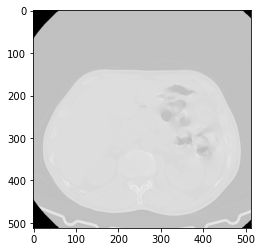

anon_8.dcm
(512, 512)


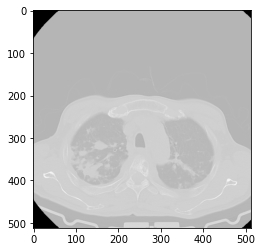

anon_9.dcm
(512, 512)


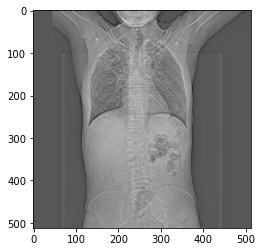

In [10]:
# Define the folder path where the images are stored
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7961\7961'

uids = []
# Loop through all files in the folder
for filename in os.listdir(folder_path):
    
    # Check if the file is an image file (you can add other file types as well)
        
        # Open the image file using Pillow
        #img = Image.open(os.path.join(folder_path, filename))
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))
        try:
            img = sample_image.pixel_array
        except:
            continue
        print(filename)
        print(img.shape)
        # Display the image
        plt.imshow(img,cmap="gray")
        plt.show()
        
        uid = sample_image.SeriesInstanceUID
        uids.append(uid)

In [11]:
from collections import Counter

uid_counts = Counter(uids)

most_common_uid = uid_counts.most_common(1)[0][0]

print(uid_counts)
print("Most common Series Instance UID:", most_common_uid)
print("Number of occurrences:", uid_counts[most_common_uid])
folder_path = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7961\7961'
tmp_path    = r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\tmp4'

if not os.path.exists(tmp_path):
    os.makedirs(tmp_path)

for filename in os.listdir(folder_path):
        sample_image = dicom.dcmread(os.path.join(folder_path, filename))   
        uid = sample_image.SeriesInstanceUID    
        if uid == most_common_uid:
            shutil.copy(os.path.join(folder_path, filename),tmp_path)
            
path_for_saving_images=r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'
if not os.path.exists(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume'):
    os.makedirs(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\volume')

dicom2nifti.dicom_series_to_nifti(tmp_path, os.path.join(path_for_saving_images, '7961' +'.nii.gz'))

Counter({'1.3.12.2.1107.5.1.7.137639.30000022053115480133100000214': 63, '1.3.12.2.1107.5.1.7.137639.30000022053115480133100000092': 5})
Most common Series Instance UID: 1.3.12.2.1107.5.1.7.137639.30000022053115480133100000214
Number of occurrences: 63


{'NII_FILE': 'C:\\Users\\DELL\\Downloads\\Manentia AI\\tmp\\lobe_sample_data\\nifti_saving\\7961.nii.gz',
 'NII': <nibabel.nifti1.Nifti1Image at 0x199cbb08f40>,
 'MAX_SLICE_INCREMENT': 5.0}

In [6]:
import nibabel as nib
import matplotlib.pyplot as plt
nifti = nib.load(r'C:\Users\DELL\Downloads\Manentia AI\mask\7899.nii.gz')
plt.imshow(nifti[0],cmap = 'gray') 

TypeError: Cannot slice image objects; consider using `img.slicer[slice]` to generate a sliced image (see documentation for caveats) or slicing image array data with `img.dataobj[slice]` or `img.get_fdata()[slice]`

In [3]:

import json

# Opening JSON file
f = open(r'C:\Users\DELL\Downloads\Manentia AI\tmp\lobe_sample_data\7897\7897.json')

# returns JSON object as
# a dictionary
data = json.load(f)
print(len(data))
# # Iterating through the json
# # list
#print(data)
for i in data:
    print(i)

4
annotations
annotators
dataset
image


In [30]:
data['annotations']

[{'annotators': [{'email': 'v7test123@gmail.com', 'full_name': 'Test xyz'}],
  'frames': {'8': {'bounding_box': {'h': 33.0,
     'w': 31.0,
     'x': 222.0,
     'y': 252.0},
    'keyframe': True,
    'polygon': {'path': [{'x': 246.0, 'y': 252.0},
      {'x': 236.0, 'y': 252.0},
      {'x': 226.0, 'y': 263.0},
      {'x': 224.0, 'y': 263.0},
      {'x': 222.0, 'y': 267.0},
      {'x': 222.0, 'y': 269.0},
      {'x': 223.0, 'y': 270.0},
      {'x': 227.0, 'y': 270.0},
      {'x': 230.0, 'y': 272.0},
      {'x': 228.0, 'y': 276.0},
      {'x': 231.0, 'y': 276.0},
      {'x': 235.0, 'y': 278.0},
      {'x': 238.0, 'y': 282.0},
      {'x': 238.0, 'y': 284.0},
      {'x': 239.0, 'y': 285.0},
      {'x': 240.0, 'y': 284.0},
      {'x': 244.0, 'y': 284.0},
      {'x': 245.0, 'y': 283.0},
      {'x': 244.0, 'y': 281.0},
      {'x': 250.0, 'y': 278.0},
      {'x': 253.0, 'y': 274.0},
      {'x': 253.0, 'y': 266.0},
      {'x': 252.0, 'y': 265.0},
      {'x': 252.0, 'y': 260.0},
      {'x': 251.

In [31]:
len(data)

4

In [1]:
import nibabel as nib
import matplotlib.pyplot as plt
nifti = nib.load(r'volume\7865.nii.gz')
nifti.shape

(512, 512, 49)

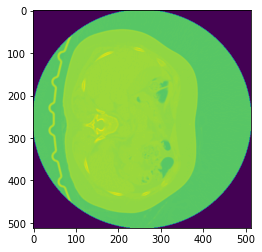

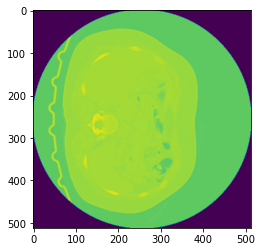

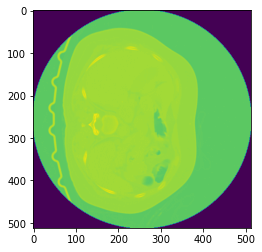

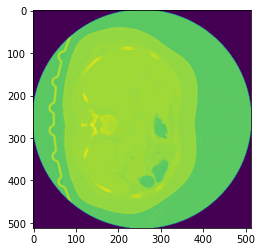

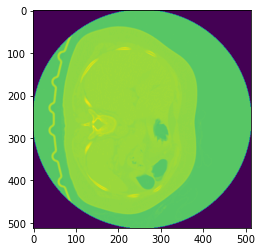

...

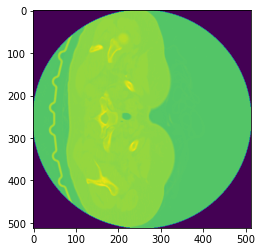

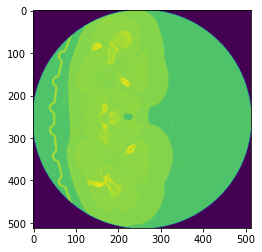

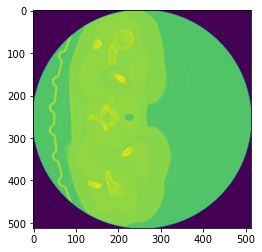

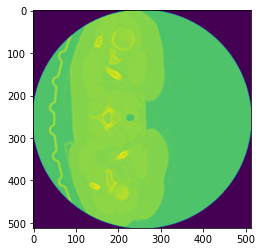

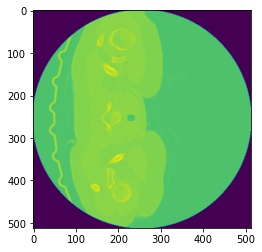

In [2]:
for i in range(nifti.shape[2]):
    plt.imshow(nifti.dataobj[:,:,i])
    plt.show()